In [1]:
# Init
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cbook as cbook
plt.rcParams.update({'font.size': 22})
import mpld3
mpld3.enable_notebook()
import root_numpy
import ROOT
from root_numpy import root2array
from matplotlib import cm

def getGlobalTime(filename):
    array = root2array(filename, 'Hits', ['ftGlob'])
    newArray = np.empty([len(array)])
    for i in range(0,len(array)):
        name = str(array[i])
        name = name.replace("(","")
        name = name.replace(")","")
        name = name.replace(",","")
        name = name.replace(" ","")
        val = float(name)
        newArray[i] = val 
    return newArray

def getXY(filename):
    arrayX = root2array(filename, 'Hits', ['fX'])
    arrayY = root2array(filename, 'Hits', ['fY'])
    newArray = np.empty([len(arrayX),2])
    for i in range(0,len(arrayX)):
        name = str(arrayX[i])
        name = name.replace("(","")
        name = name.replace(")","")
        name = name.replace(",","")
        name = name.replace(" ","")
        val = float(name)
        newArray[i,0] = val 
    for i in range(0,len(arrayY)):
        name = str(arrayY[i])
        name = name.replace("(","")
        name = name.replace(")","")
        name = name.replace(",","")
        name = name.replace(" ","")
        val = float(name)
        newArray[i,1] = val     
    return newArray

Welcome to JupyROOT 6.24/02


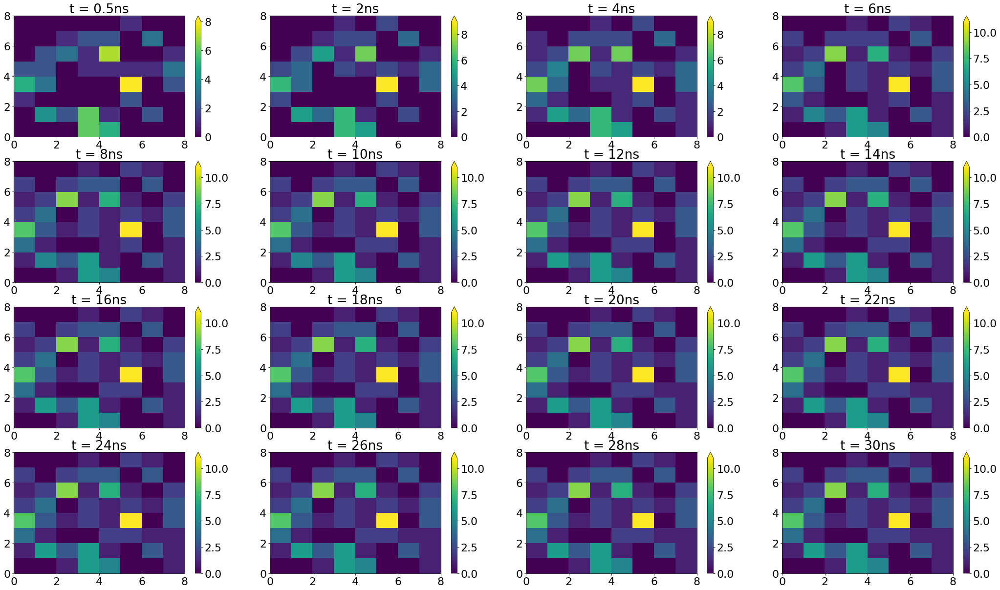

In [24]:
run = 10
subrun = 0
file = './Run_' + str(run) + '/Run-' + str(run)+ '_SubRun-' + str(subrun) + '.root'
savename = "./Run_" + str(run) + "/R" + str(run) + "S" + str(subrun) + "_WbLS_17ns_0_30.png"
tGlob = getGlobalTime(file)
cord = getXY(file)
x = cord[:,0]
y = cord[:,1]
tmin = min(tGlob)
tGlob = tGlob - tmin

Ddt = 2

fig, axs = plt.subplots(4, 4)
fig.set_size_inches(36, 21)

binx = int(8)
biny = int(8)

AxPos1=0
AxPos2=0
for t in range(0,16):
    mapT = []
    for i in range(0,len(tGlob)):
        if t==0:
            dt=0.5
        else:
            dt=t*Ddt
            
        if tGlob[i] < dt:
            mapT.append([x[i], y[i], tGlob[i]])
        
    mapT = np.asarray(mapT)
    
    if AxPos2 == 4:
        AxPos1+=1
        AxPos2=0
    
    ax1 = int(AxPos1)
    ax2 = int(AxPos2)
    heatmap,xe ,ye = np.histogram2d(mapT[:,0], mapT[:,1], bins=(binx,biny))
    pt = axs[ax1, ax2].pcolor(heatmap, shading='auto')
    name = 't = ' + str(dt) + 'ns'
    axs[ax1, ax2].set_title(name)
    fig.colorbar(pt, ax=axs[ax1, ax2], extend='max')
    
    AxPos2+=1


fig.savefig(savename,facecolor='w')

<ipython-input-25-2b258f4feae9>:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2)


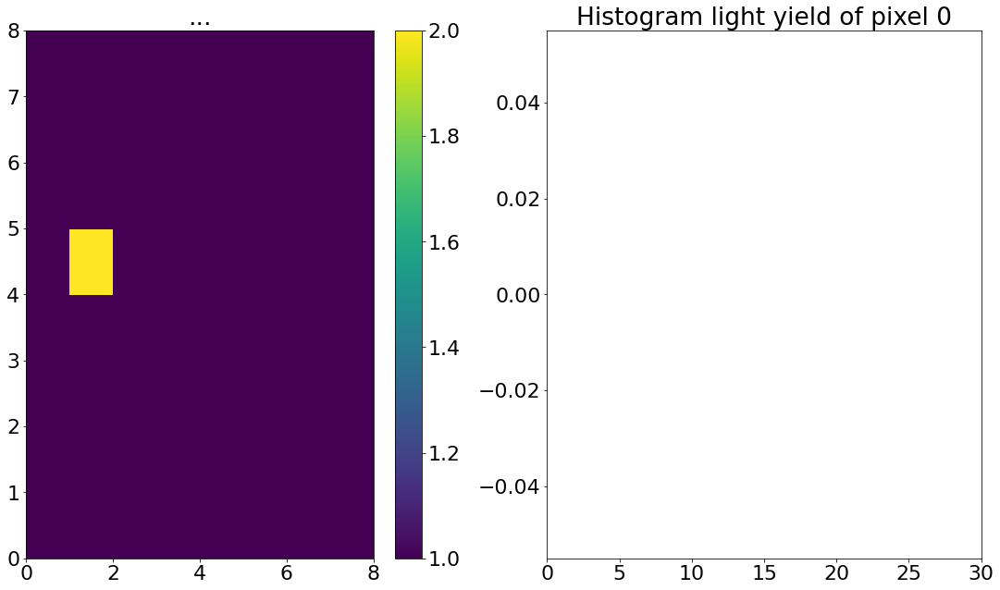

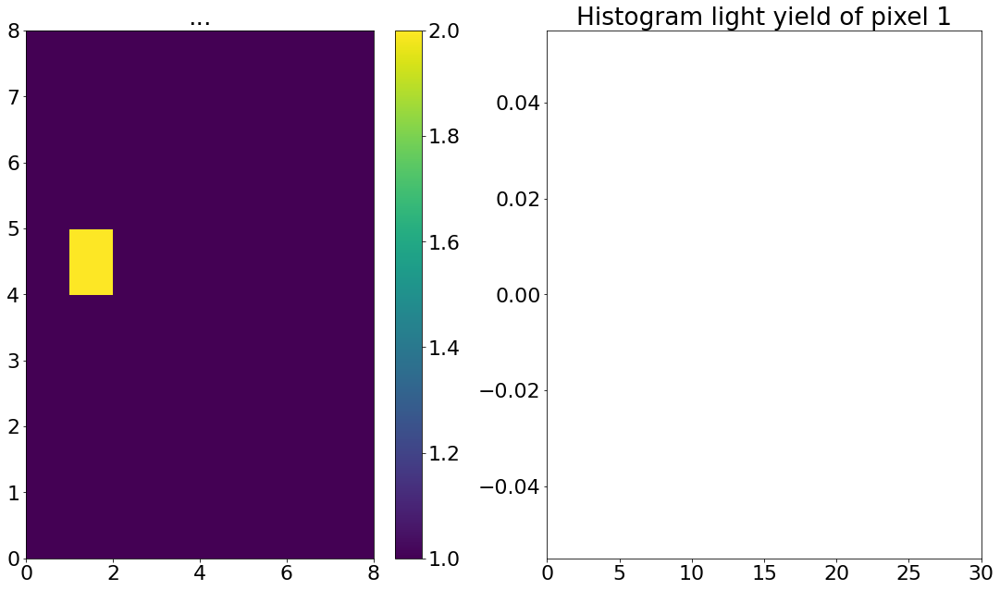

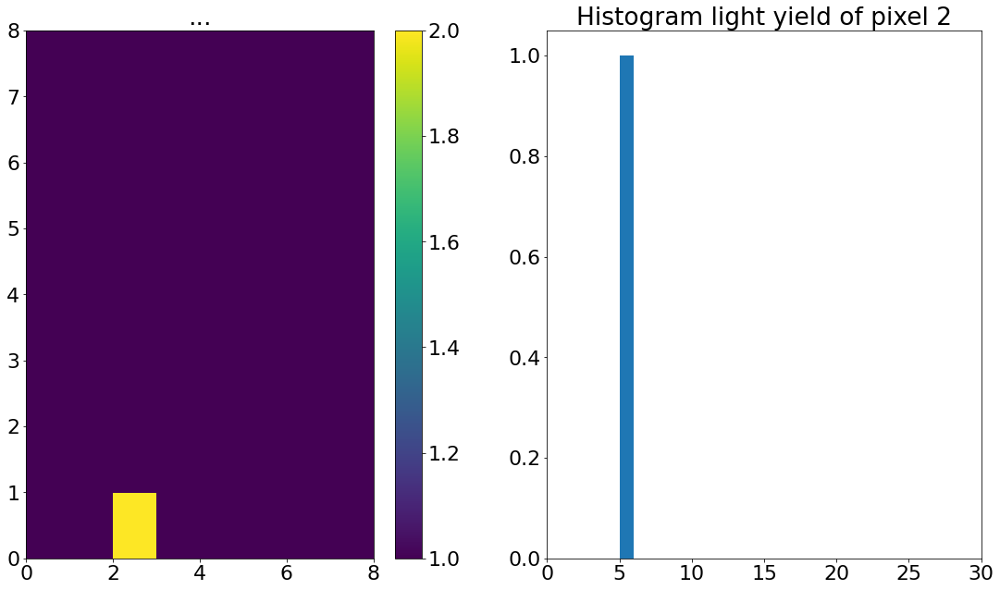

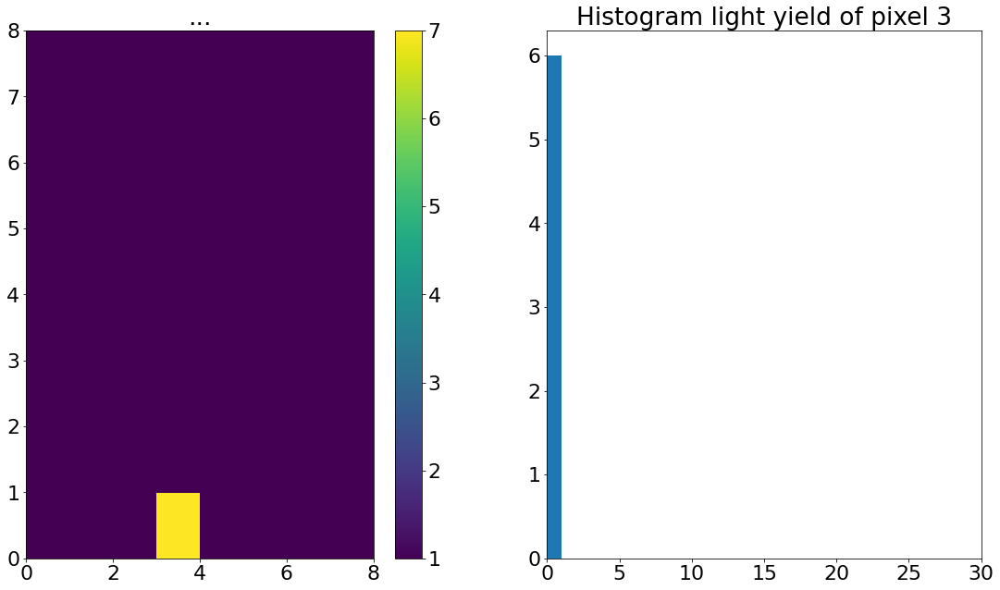

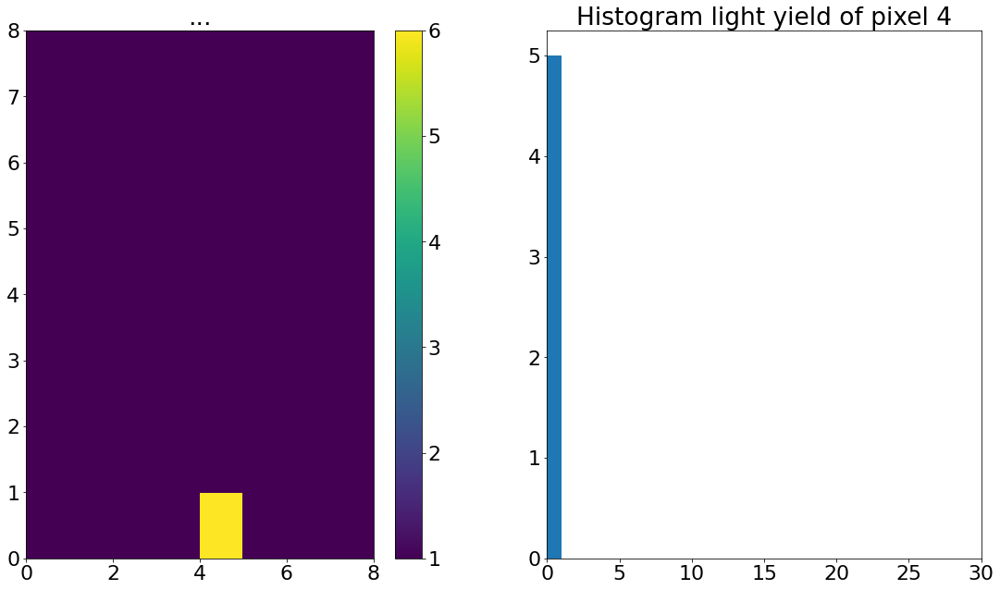

...

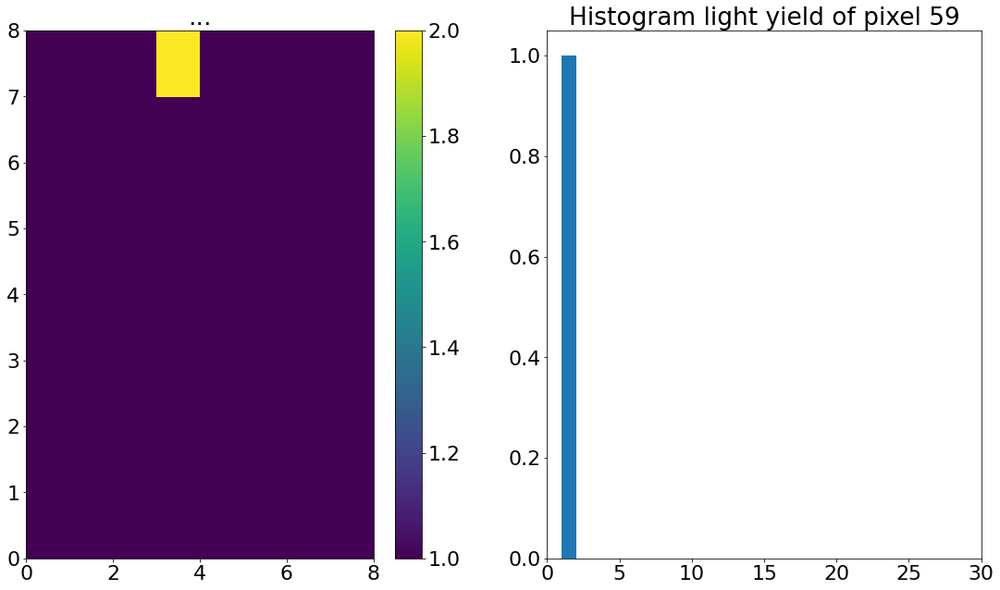

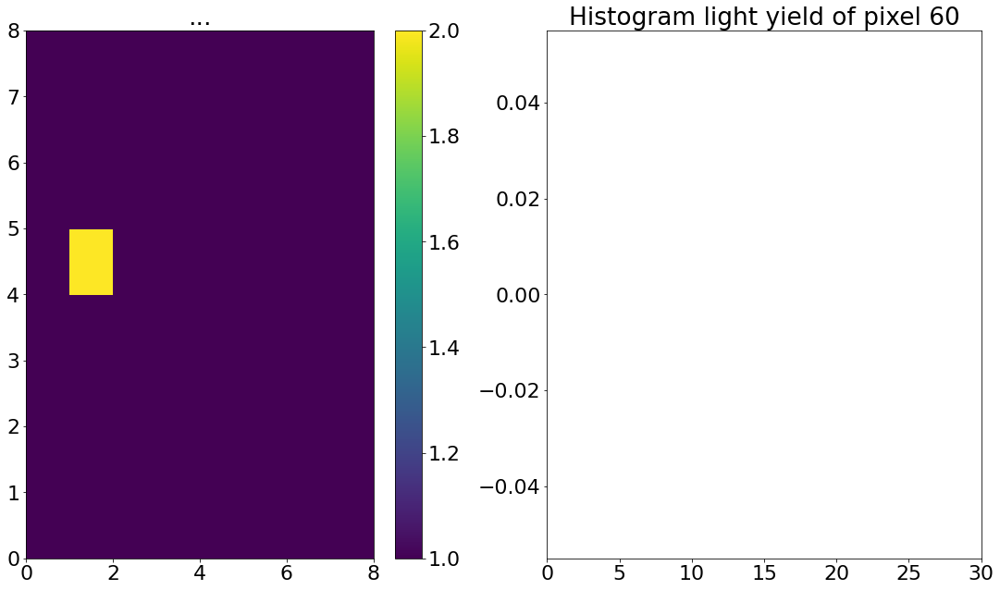

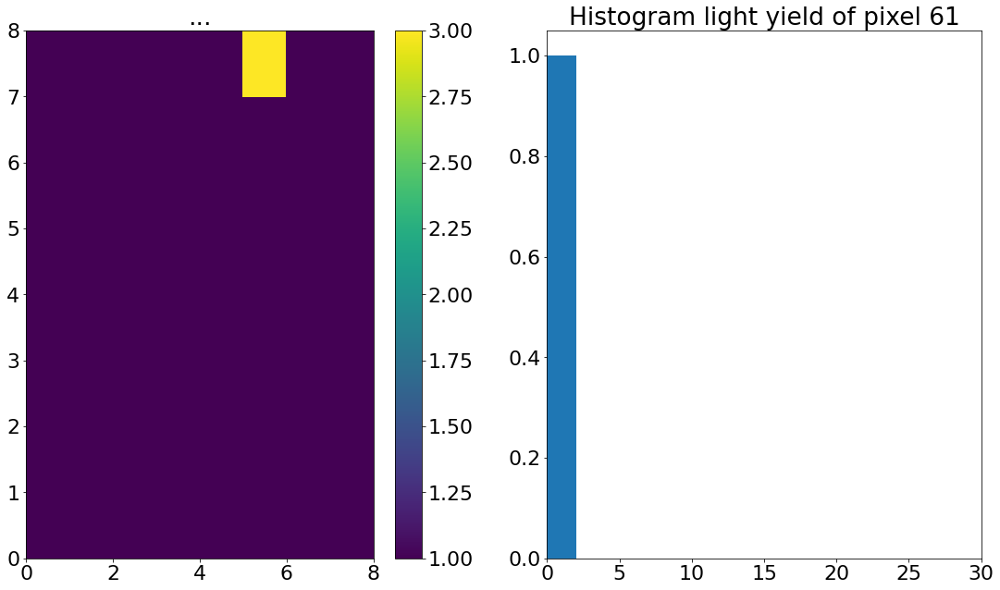

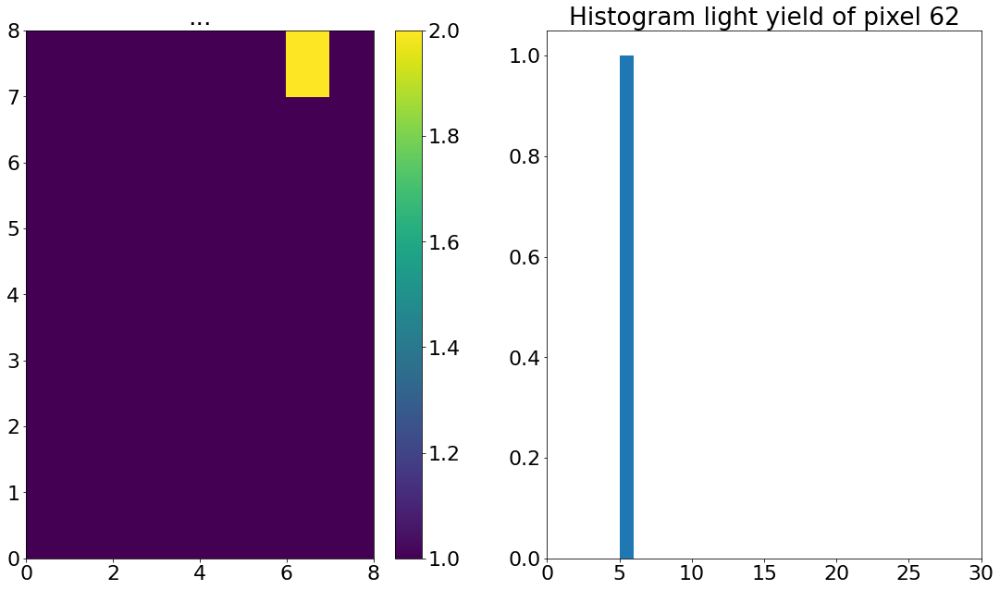

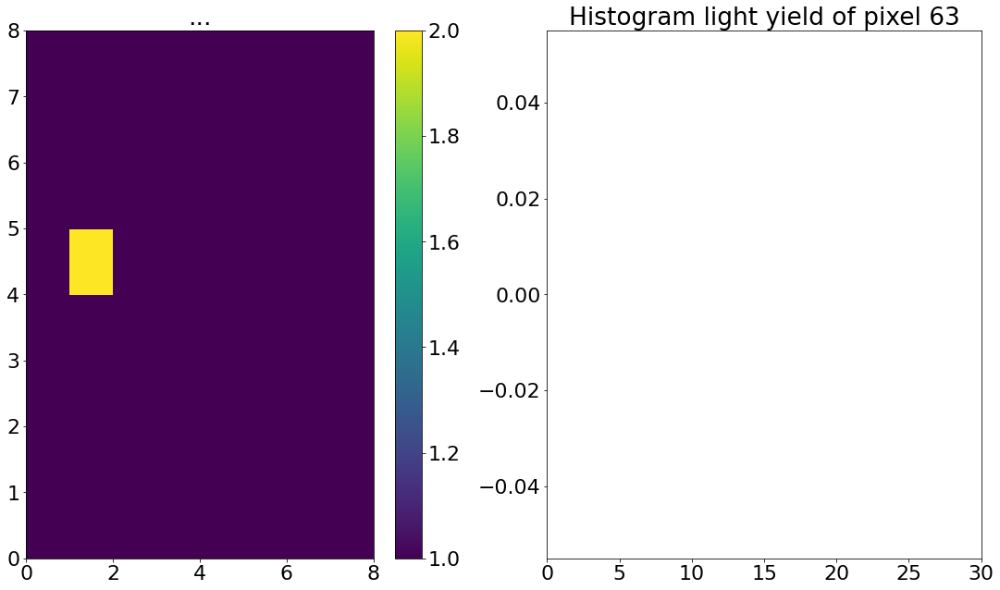

In [25]:
run = 10
subrun = 0
file = './Run_' + str(run) + '/Run-' + str(run)+ '_SubRun-' + str(subrun) + '.root'


for pixel in range(0,64):
    savename = "./Run_" + str(run) + "/Pixel" + str(pixel) + "_R" + str(run) + "S" + str(subrun) + ".png"
    tGlob = getGlobalTime(file)
    cord = getXY(file)
    x = cord[:,0]
    y = cord[:,1]
    tmin = min(tGlob)
    tGlob = tGlob - tmin

    Ddt = 2

    binx = int(8)
    biny = int(8)

    mapT = []

    if len(tGlob)==len(x) and len(tGlob) == len(y):

        for i in range(0,len(tGlob)):
            mapT.append([x[i], y[i], tGlob[i]])

        mapT = np.asarray(mapT)
    else:
        print("Mismatch")

    #print(mapT)

    TOH = []
    ct = 0
    cpx = [-94.675, -67.625, -40.575, -13.525, 13.525, 40.575, 67.625, 94.675]
    cpy = [-94.675, -67.625, -40.575, -13.525, 13.525, 40.575, 67.625, 94.675]
    for c1 in range(0,len(cpx)):
        for c2 in range(0,len(cpy)):
            TOH.append([ct,cpx[c1],cpy[c2]])
            ct+=1
    TOH = np.asarray(TOH)
    #print(TOH)  

    TOC = []        
    for j in range(0,len(mapT)):
        for k in range(0,len(TOH)):
            if mapT[j][0] == TOH[k][1] and mapT[j][1] == TOH[k][2]:
                if TOH[k][0] == pixel:
                    TOC.append([mapT[j][2],mapT[j][0],mapT[j][1]])
    TOC = np.asarray(TOC)
    if TOC.size == 0:
        TOC = []
        TOC.append([-1.,mapT[j][0],mapT[j][1]])
        TOC = np.asarray(TOC)
    #print(TOC)

    POS = []
    for tmp in range(0,len(TOC)):
        POS.append([TOC[tmp,1], TOC[tmp,2]])
    for tmp2 in range(0,len(TOH)):
        POS.append([TOH[tmp2,1], TOH[tmp2,2]])
    POS = np.asarray(POS)
    #print(POS)


    fig, axs = plt.subplots(1, 2)
    fig.set_size_inches(18.5, 10.5)        

    heatmap,xe ,ye = np.histogram2d(POS[:,0], POS[:,1], bins=(binx,biny))
    p = axs[0].pcolor(heatmap, shading='auto')
    axs[0].set_title('...')
    fig.colorbar(p, ax=axs[0])


    left = 0
    right = 30
    resol = 1                    
    axs[1].hist(TOC[:,0],bins=np.arange(min(tGlob), max(tGlob) + resol, resol))
    axs[1].set_xlim(left, right)
    histname = "Histogram light yield of pixel " + str(pixel)
    axs[1].set_title(histname)
    #axs[1].set_yscale("symlog")            

    fig.savefig(savename,facecolor='w')